# Homework Assignment  5

In [ ]:
!pip install turicreate
!pip install networkx

     |████████████████████████████████| 92.0 MB 18 kB/s 
     |████████████████████████████████| 86.4 MB 71 kB/s 
     |████████████████████████████████| 3.5 MB 43.1 MB/s 
     |████████████████████████████████| 3.6 MB 48.2 MB/s 
     |████████████████████████████████| 322 kB 53.6 MB/s 
     |████████████████████████████████| 18.3 MB 451 kB/s 
     |████████████████████████████████| 50 kB 7.4 MB/s 
     |████████████████████████████████| 449 kB 52.6 MB/s 
     |████████████████████████████████| 3.8 MB 39.9 MB/s 
     |████████████████████████████████| 20.1 MB 85.8 MB/s 
     |████████████████████████████████| 2.9 MB 44.9 MB/s 
  Created wheel for prettytable: filename=prettytable-0.7.2-py3-none-any.whl size=13714 sha256=031334de80391a25f4c478a7d178c1a4d044c43f55d0cd0be79b4c1f03b67a4e
  Stored in directory: /root/.cache/pip/wheels/b2/7f/f6/f180315b584f00445045ff1699b550fa895d09471337ce21c6
  Created wheel for resampy: filename=resampy-0.2.1-py3-none-any.whl size=320859 sha256=962ecdc4f3

**Question 1:** Select a directed network, and develop a simple
    link prediction classifier based on the network's directed topology (40pt).
    Use node or link embedding features and try to improve the classification (20pt)
    
**Bonus:** Evaluate the classifier's ability to predict future links (10pt)
    
** Note:** You can use [Reddit community networks](http://dynamics.cs.washington.edu/data.html), or search
for networks using [The Colorado Index of Complex Networks](https://icon.colorado.edu/).

In [ ]:
# Creating a dataset directory
!mkdir ./datasets/
!mkdir ./datasets/epinion
!wget http://snap.stanford.edu/data/soc-Epinions1.txt.gz -O ./datasets/epinion/soc-Epinions1.txt.gz
!gzip ./datasets/epinion/soc-Epinions1.txt.gz -d ./datasets/epinion/
!ls ./datasets/epinion/

mkdir: cannot create directory ‘./datasets/’: File exists
mkdir: cannot create directory ‘./datasets/epinion’: File exists
--2022-05-02 19:35:20--  http://snap.stanford.edu/data/soc-Epinions1.txt.gz
Resolving snap.stanford.edu (snap.stanford.edu)... 171.64.75.80
Connecting to snap.stanford.edu (snap.stanford.edu)|171.64.75.80|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1630437 (1.6M) [application/x-gzip]
Saving to: ‘./datasets/epinion/soc-Epinions1.txt.gz’

./datasets/epinion/ 100%[===================>]   1.55M  1.70MB/s    in 0.9s    

2022-05-02 19:35:21 (1.70 MB/s) - ‘./datasets/epinion/soc-Epinions1.txt.gz’ saved [1630437/1630437]

gzip: ./datasets/epinion/soc-Epinions1.txt already exists; do you wish to overwrite (y or n)? y
gzip: ./datasets/epinion/ is a directory -- ignored
soc-Epinions1.txt


In [ ]:
# Select a directed network, and develop a simple link prediction classifier based on the network's directed topology

import networkx as nx
import turicreate as tc

g = nx.read_edgelist('./datasets/epinion/soc-Epinions1.txt', create_using=nx.DiGraph())
nx.info(g)

'DiGraph with 75879 nodes and 508837 edges'

In [ ]:
g.nodes()

NodeView(('0', '4', '5', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '799', '1', '169', '223', '233', '295', '310', '333', '335', '368', '388', '401', '409', '426', '427', '433', '449', '5

In [ ]:
g.in_edges()

InEdgeView([('5', '0'), ('8', '0'), ('9', '0'), ('11', '0'), ('12', '0'), ('15', '0'), ('17', '0'), ('21', '0'), ('22', '0'), ('24', '0'), ('25', '0'), ('26', '0'), ('27', '0'), ('29', '0'), ('30', '0'), ('31', '0'), ('33', '0'), ('34', '0'), ('36', '0'), ('37', '0'), ('38', '0'), ('39', '0'), ('41', '0'), ('42', '0'), ('43', '0'), ('44', '0'), ('45', '0'), ('46', '0'), ('47', '0'), ('49', '0'), ('50', '0'), ('51', '0'), ('53', '0'), ('55', '0'), ('56', '0'), ('58', '0'), ('59', '0'), ('60', '0'), ('61', '0'), ('62', '0'), ('63', '0'), ('65', '0'), ('66', '0'), ('67', '0'), ('69', '0'), ('70', '0'), ('71', '0'), ('72', '0'), ('75', '0'), ('78', '0'), ('79', '0'), ('82', '0'), ('83', '0'), ('84', '0'), ('85', '0'), ('86', '0'), ('87', '0'), ('89', '0'), ('90', '0'), ('91', '0'), ('93', '0'), ('94', '0'), ('96', '0'), ('97', '0'), ('101', '0'), ('104', '0'), ('105', '0'), ('106', '0'), ('107', '0'), ('108', '0'), ('109', '0'), ('110', '0'), ('112', '0'), ('113', '0'), ('114', '0'), ('115

In [ ]:
g.out_edges()

OutEdgeView([('0', '4'), ('0', '5'), ('0', '7'), ('0', '8'), ('0', '9'), ('0', '10'), ('0', '11'), ('0', '12'), ('0', '13'), ('0', '14'), ('0', '15'), ('0', '16'), ('0', '17'), ('0', '18'), ('0', '19'), ('0', '20'), ('0', '21'), ('0', '22'), ('0', '23'), ('0', '24'), ('0', '25'), ('0', '26'), ('0', '27'), ('0', '28'), ('0', '29'), ('0', '30'), ('0', '31'), ('0', '32'), ('0', '33'), ('0', '34'), ('0', '35'), ('0', '36'), ('0', '37'), ('0', '38'), ('0', '39'), ('0', '40'), ('0', '41'), ('0', '42'), ('0', '43'), ('0', '44'), ('0', '45'), ('0', '46'), ('0', '47'), ('0', '48'), ('0', '49'), ('0', '50'), ('0', '51'), ('0', '52'), ('0', '53'), ('0', '54'), ('0', '55'), ('0', '56'), ('0', '57'), ('0', '58'), ('0', '59'), ('0', '60'), ('0', '61'), ('0', '62'), ('0', '63'), ('0', '64'), ('0', '65'), ('0', '66'), ('0', '67'), ('0', '68'), ('0', '69'), ('0', '70'), ('0', '71'), ('0', '72'), ('0', '73'), ('0', '74'), ('0', '75'), ('0', '76'), ('0', '77'), ('0', '78'), ('0', '79'), ('0', '80'), ('0'

Epinions trust network (2003):

A who-trusts-whom online social network of the general consumer review site Epinions.com. Members can decide whether to "trust" each other. These trust relationships are combined with review ratings to determine which reviews are shown to the user. Hosted by Stanford Network Analysis Project (SNAP).

In [ ]:
# The members that trusted by u and v
def common_trustees(g,u,v):
    if not g.has_node(u) or not g.has_node(v):
        return None
    return set(g.neighbors(u)) & set(g.neighbors(v))

common_trustees(g,'0','4')

{'10',
 '100',
 '101',
 '107',
 '108',
 '117',
 '118',
 '12',
 '135',
 '18',
 '19',
 '25',
 '27',
 '28',
 '30',
 '31',
 '32',
 '33',
 '38',
 '40',
 '50',
 '51',
 '64',
 '73',
 '74',
 '81',
 '83',
 '88',
 '96'}

In [ ]:
# The members that trust u and v
def common_trusts(g,u,v):
    if not g.has_node(u) or not g.has_node(v):
        return None
    return set(g.predecessors(u)) & set(g.predecessors(v))

common_trusts(g,'0','4')

{'101',
 '107',
 '11',
 '117',
 '12',
 '141',
 '145',
 '155',
 '158',
 '165',
 '169',
 '191',
 '195',
 '203',
 '228',
 '233',
 '235',
 '24',
 '25',
 '26',
 '279',
 '30',
 '31',
 '33',
 '36',
 '38',
 '421',
 '427',
 '5',
 '50',
 '51',
 '560',
 '65',
 '754',
 '763',
 '766',
 '83'}

In [ ]:
import operator

# Return all members who are trusted by the members that v trusts and v does not trust
def find_who_trust(g, v):
    trust_set = set(g.neighbors(v))
    trust_of_trust_set = set()
    for t in trust_set:
        trust_of_trust_set |= set(g.neighbors(t))
    trust_of_trust_set -= trust_set
    trust_of_trust_set -= {v}
    return trust_of_trust_set


def rank_trust_of_trust(g, v):
    rank_dict = {}
    vertices_set = find_who_trust(g, v)
    for u in vertices_set:
        rank_dict[u] = len(common_trustees(g, v, u))
    sorted_d = sorted(rank_dict.items(), key=operator.itemgetter(1), reverse=True)
    return sorted_d

rank_trust_of_trust(g, '101')

[('634', 112),
 ('443', 79),
 ('637', 77),
 ('44', 76),
 ('279', 76),
 ('824', 74),
 ('492', 72),
 ('145', 72),
 ('169', 71),
 ('25', 71),
 ('335', 71),
 ('763', 70),
 ('117', 69),
 ('68', 68),
 ('123', 67),
 ('663', 63),
 ('942', 62),
 ('212', 62),
 ('210', 61),
 ('620', 61),
 ('445', 59),
 ('629', 57),
 ('43', 56),
 ('71399', 55),
 ('107', 54),
 ('639', 54),
 ('100', 54),
 ('860', 53),
 ('661', 53),
 ('576', 53),
 ('154', 53),
 ('725', 53),
 ('19', 53),
 ('319', 53),
 ('2279', 53),
 ('51', 52),
 ('970', 51),
 ('35', 51),
 ('233', 50),
 ('203', 50),
 ('426', 50),
 ('289', 49),
 ('664', 49),
 ('3234', 49),
 ('1225', 48),
 ('63', 48),
 ('291', 48),
 ('455', 47),
 ('37', 47),
 ('234', 47),
 ('5', 46),
 ('350', 45),
 ('10', 45),
 ('215', 44),
 ('384', 44),
 ('1059', 44),
 ('3850', 43),
 ('751', 43),
 ('618', 43),
 ('155', 42),
 ('481', 42),
 ('1167', 42),
 ('917', 41),
 ('1379', 41),
 ('217', 41),
 ('432', 41),
 ('102', 41),
 ('428', 41),
 ('357', 40),
 ('2034', 40),
 ('124', 40),
 ('201'

In [ ]:
# This is for predicting missing links scenario
import random

def select_random_existing_links(g, n):
    l =list(g.edges())
    random.shuffle(l)
    return l[:n]

def get_random_trust_of_trust(g, v, max_tries=100):
    for i in range(max_tries):

      v_list = list(g.neighbors(v))
      if not v_list:
        return None
      else:
        u = random.choice(v_list)

      u_list = list(g.neighbors(u))
      if not u_list:
        return None
      else:
        x = random.choice(u_list)

      if not g.has_edge(v,x):
          return x

    return None


def select_random_non_existing_links(g, n):
    select_links = set()
    v_list = list(g.nodes())
    while len(select_links) < n:
        v = random.choice(v_list)
        u = get_random_trust_of_trust(g, v)
        if u is None:
            continue
        select_links.add((v,u))
    return list(select_links)


postive_links = select_random_existing_links(g,100)
negative_links = select_random_non_existing_links(g,100)

In [ ]:
!pip install tqdm

In [ ]:
from tqdm import tqdm_notebook as tqdm

def trust_measure(g, u,v):
    s = 0
    for x in find_who_trust(g,u):
        for y in find_who_trust(g,v):
            if g.has_edge(x,y) or x == y:
                s += 1
    return s

def total_trust(g, u, v):
    return len(set(g.neighbors(v)) | set(g.neighbors(u)))

def total_trusted(g, u, v):
    return len(set(g.predecessors(v)) | set(g.predecessors(u)))

def get_features_dict(g,u, v):
    removed_edge = False
    if g.has_edge(u,v):
        g.remove_edge(u,v) #  remove edge before feature calculation
        removed_edge = True
    try:
        d = {
            'out_degree_v': len(list(g.neighbors(v))),
            'out_degree_u': len(list(g.neighbors(u))),
            'in_degree_v': len(list(g.predecessors(v))),
            'in_degree_u': len(list(g.predecessors(u))),
            'total_trust': total_trust(g,u,v),
            'total_trusted': total_trusted(g,u,v),
            'common_trustees': len(common_trustees(g,u,v)),
            'common_trusts': len(common_trusts(g,u,v)),
            'trust_measure': trust_measure(g, u,v)
        }
    except:
        if removed_edge:
            g.add_edge(u,v) # return the edge back to the graph
        return None


    if removed_edge:
        g.add_edge(u,v) # return the edge back to the graph
    return d

links_features = []

for i in tqdm(range(len(postive_links))):
    u,v = postive_links[i]
    d = get_features_dict(g, u,v )
    if d is None:
        continue
    d['class'] = True
    links_features.append(d)

for i in tqdm(range(len(negative_links))):
    u,v = negative_links[i]
    d = get_features_dict(g, u,v )
    if d is None:
        continue
    d['class'] = False
    links_features.append(d)
links_features[0]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/100 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/100 [00:00<?, ?it/s]

{'class': True,
 'common_trustees': 9,
 'common_trusts': 11,
 'in_degree_u': 63,
 'in_degree_v': 233,
 'out_degree_u': 169,
 'out_degree_v': 73,
 'total_trust': 233,
 'total_trusted': 285,
 'trust_measure': 150467}

In [ ]:
import turicreate as tc

features_list = ['out_degree_v', 'out_degree_u','in_degree_v','in_degree_u','total_trust','total_trusted','common_trustees','common_trusts', 'trust_measure', 'class']
data_dict = {f:[] for f in features_list}


for d in links_features:
    for feature in features_list:
        data_dict[feature].append(d[feature])
sf = tc.SFrame(data_dict)
sf


class,common_trustees,common_trusts,in_degree_u,in_degree_v,out_degree_u,out_degree_v,total_trust,total_trusted
1,9,11,63,233,169,73,233,285
1,95,46,103,66,121,131,157,123
1,2,0,68,1,512,3,513,69
1,24,8,40,258,99,240,315,290
1,4,10,56,799,107,37,140,845
1,0,4,19,290,53,88,141,305
1,3,1,8,338,66,37,100,345
1,0,0,0,109,0,77,77,109
1,3,0,1,118,21,44,62,119
1,0,0,0,16,0,7,7,16


In [ ]:
test, train  = sf.random_split(0.2)
print(f"Train size {len(train)}\nTest size: {len(test)}" )
features_list = ['out_degree_v', 'out_degree_u','in_degree_v','in_degree_u','total_trust','total_trusted','common_trustees','common_trusts', 'trust_measure']
cls = tc.classifier.create(train,features=features_list, target="class")

Train size 163
Test size: 37
PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

PROGRESS: The following methods are available for this type of problem.
PROGRESS: BoostedTreesClassifier, RandomForestClassifier, DecisionTreeClassifier, SVMClassifier, LogisticClassifier
PROGRESS: The returned model will be chosen according to validation accuracy.


Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 154

Number of classes           : 2

Number of feature columns   : 9

Number of unpacked features : 9

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.002932     | 0.954545          | 0.444444            | 0.522388          | 0.736409            |

| 2         | 0.005573     | 0.954545          | 0.555556            | 0.420438          | 0.753980            |

| 3         | 0.009443     | 0.954545          | 0.555556            | 0.339179          | 0.747016            |

| 4         | 0.011381     | 0.954545          | 0.555556            | 0.283231          | 0.746833            |

| 5         | 0.013903     | 0.967532          | 0.555556            | 0.238100          | 0.752686            |

| 10        | 0.031537     | 0.993506          | 0.666667            | 0.117500          | 0.771849            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Random forest classifier:

--------------------------------------------------------

Number of examples          : 154

Number of classes           : 2

Number of feature columns   : 9

Number of unpacked features : 9

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.004597     | 0.909091          | 0.666667            | 0.357208          | 0.787986            |

| 2         | 0.009728     | 0.896104          | 0.555556            | 0.324764          | 0.655444            |

| 3         | 0.014543     | 0.922078          | 0.555556            | 0.314073          | 0.769069            |

| 4         | 0.018213     | 0.935065          | 0.666667            | 0.314917          | 0.791227            |

| 5         | 0.023403     | 0.922078          | 0.666667            | 0.318624          | 0.742444            |

| 10        | 0.045019     | 0.915584          | 0.666667            | 0.323781          | 0.697695            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Decision tree classifier:

--------------------------------------------------------

Number of examples          : 154

Number of classes           : 2

Number of feature columns   : 9

Number of unpacked features : 9

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.002329     | 0.954545          | 0.444444            | 0.293066          | 0.929045            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

SVM:

--------------------------------------------------------

Number of examples          : 154

Number of classes           : 2

Number of feature columns   : 9

Number of unpacked features : 9

Number of coefficients    : 10

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 0.000570     | 0.506494          | 0.222222            |

| 1         | 5        | 5.000000  | 0.001663     | 0.740260          | 0.777778            |

| 2         | 10       | 4.560197  | 0.002935     | 0.766234          | 0.777778            |

| 3         | 16       | 1.054313  | 0.004373     | 0.792208          | 0.666667            |

| 4         | 23       | 2.003227  | 0.009660     | 0.785714          | 0.666667            |

| 9         | 37       | 1.482569  | 0.021208     | 0.766234          | 0.666667            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

Logistic regression:

--------------------------------------------------------

Number of examples          : 154

Number of classes           : 2

Number of feature columns   : 9

Number of unpacked features : 9

Number of coefficients      : 10

Starting Newton Method

--------------------------------------------------------

PROGRESS: Model selection based on validation accuracy:
PROGRESS: ---------------------------------------------
PROGRESS: BoostedTreesClassifier          : 0.6666666666666666
PROGRESS: RandomForestClassifier          : 0.6666666666666666
PROGRESS: DecisionTreeClassifier          : 0.4444444444444444
PROGRESS: SVMClassifier                   : 0.6666666666666666
PROGRESS: LogisticClassifier              : 0.6666666666666666
PROGRESS: ---------------------------------------------
PROGRESS: Selecting BoostedTreesClassifier based on validation set performance.


+-----------+----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Elapsed Time | Training Accuracy | Validation Accuracy |

In [ ]:
cls

+-----------+----------+--------------+-------------------+---------------------+

| 1         | 2        | 0.000756     | 0.759740          | 0.777778            |

| 2         | 3        | 0.001639     | 0.772727          | 0.666667            |

| 3         | 4        | 0.002410     | 0.779221          | 0.666667            |

| 4         | 5        | 0.003195     | 0.785714          | 0.666667            |

| 5         | 6        | 0.003985     | 0.798701          | 0.666667            |

| 7         | 8        | 0.005505     | 0.805195          | 0.666667            |

Class                          : BoostedTreesClassifier

Schema
------
Number of examples             : 154
Number of feature columns      : 9
Number of unpacked features    : 9
Number of classes              : 2

Settings
--------
Number of trees                : 10
Max tree depth                 : 6
Training time (sec)            : 0.0326
Training accuracy              : 0.9935
Validation accuracy            : 0.6667
Training log_loss              : 0.1175
Validation log_loss            : 0.7718
Training auc                   : 0.9998
Validation auc                 : 0.8571

+-----------+----------+--------------+-------------------+---------------------+

SUCCESS: Optimal solution found.

In [ ]:
# Evaluate the classifier's ability to predict future links

results = cls.evaluate(test)
results

{'accuracy': 0.7297297297297297,
 'auc': 0.8588235294117649,
 'confusion_matrix': Columns:
 	target_label	int
 	predicted_label	int
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |      1       |        1        |   15  |
 |      1       |        0        |   5   |
 |      0       |        1        |   5   |
 |      0       |        0        |   12  |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.75,
 'log_loss': 0.47519520480579985,
 'precision': 0.75,
 'recall': 0.75,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 1001
 
 Data:
 +-----------+-----+-----+----+----+
 | threshold | fpr | tpr | p  | n  |
 +-----------+-----+-----+----+----+
 |    0.0    | 1.0 | 1.0 | 20 | 17 |
 |   0.001   | 1.0 | 1.0 | 20 | 17 |
 |   0.002   | 1.0 | 1.0 | 20 | 17 |
 |   0.003   | 1.0 | 1.0 | 20 | 17 |
 |   0.0

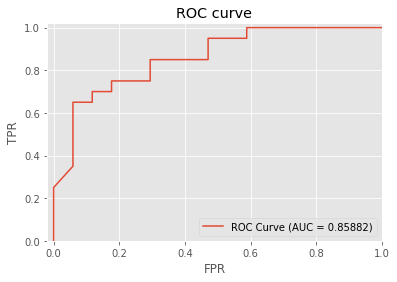

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('ggplot')
plt.plot(results['roc_curve']['fpr'],
         results['roc_curve']['tpr'],
         label='ROC Curve (AUC = %0.5f)' %results['auc'])

plt.xlim([-0.02, 1.0])
plt.ylim([0., 1.02])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.legend()
plt.show()

In [ ]:
cls.classify(test)

class,probability
0,0.8695817291736603
1,0.9436566829681396
0,0.7602044641971588
0,0.8013188540935516
1,0.9587352275848389
1,0.9258947968482971
1,0.9258947968482971
1,0.8291510343551636
1,0.8756723999977112
1,0.9502769708633423


In [ ]:
!pip install karateclub

In [ ]:
l =  zip(g.nodes(), range(len(g.nodes())))
l = list(l)
l[:10]

[('0', 0),
 ('4', 1),
 ('5', 2),
 ('7', 3),
 ('8', 4),
 ('9', 5),
 ('10', 6),
 ('11', 7),
 ('12', 8),
 ('13', 9)]

In [ ]:
nodes_dict = dict(l)
r_node_dict = {v:k for k,v in nodes_dict.items()}
list(r_node_dict.items())[:10]

[(0, '0'),
 (1, '4'),
 (2, '5'),
 (3, '7'),
 (4, '8'),
 (5, '9'),
 (6, '10'),
 (7, '11'),
 (8, '12'),
 (9, '13')]

In [ ]:
h = nx.DiGraph()
for e1,e2 in g.edges():
  h.add_edge(nodes_dict[e1], nodes_dict[e2])
print(nx.info(g))
print(nx.info(h))

DiGraph with 75879 nodes and 508837 edges
DiGraph with 75879 nodes and 508837 edges


In [ ]:
# Use node or link embedding features and try to improve the classification

import karateclub

model = karateclub.DeepWalk()

model.fit(h)
embedding = model.get_embedding()
embedding


array([[ 5.9192371e-01,  2.6652101e-01, -1.3257029e+00, ...,
         3.8035393e-01, -6.2748462e-01,  1.3467550e-01],
       [ 1.0955211e-01, -1.4833605e+00,  5.0908476e-02, ...,
         8.5645735e-02, -2.3776986e-01,  9.4169641e-01],
       [-3.6262658e-01, -9.6385306e-01, -4.0790859e-01, ...,
         1.2013061e+00,  2.0177849e-02,  9.9890941e-01],
       ...,
       [-1.3013920e-03, -6.0330792e-03, -3.1662383e-04, ...,
        -1.4258940e-03, -1.7032910e-03, -6.8238280e-03],
       [-2.9842996e-03, -2.7463208e-03,  4.3576807e-03, ...,
         3.8455708e-03, -8.6806333e-03, -6.0119089e-03],
       [-2.6736823e-03,  5.5930791e-03,  4.6047694e-03, ...,
         3.3062054e-03,  4.0620677e-03, -3.4287081e-03]], dtype=float32)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE

X = embedding
print("Computed X: ", X.shape)
X_embedded = TSNE(n_components=2,perplexity=20, n_iter=5000, verbose=2).fit_transform(X)
print("Computed t-SNE", X_embedded.shape)

Computed X:  (75879, 128)
[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 75879 samples in 0.013s...


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computed neighbors for 75879 samples in 192.598s...
[t-SNE] Computed conditional probabilities for sample 1000 / 75879
[t-SNE] Computed conditional probabilities for sample 2000 / 75879
[t-SNE] Computed conditional probabilities for sample 3000 / 75879
[t-SNE] Computed conditional probabilities for sample 4000 / 75879
[t-SNE] Computed conditional probabilities for sample 5000 / 75879
[t-SNE] Computed conditional probabilities for sample 6000 / 75879
[t-SNE] Computed conditional probabilities for sample 7000 / 75879
[t-SNE] Computed conditional probabilities for sample 8000 / 75879
[t-SNE] Computed conditional probabilities for sample 9000 / 75879
[t-SNE] Computed conditional probabilities for sample 10000 / 75879
[t-SNE] Computed conditional probabilities for sample 11000 / 75879
[t-SNE] Computed conditional probabilities for sample 12000 / 75879
[t-SNE] Computed conditional probabilities for sample 13000 / 75879
[t-SNE] Computed conditional probabilities for sample 14000 / 758

In [ ]:
df = pd.DataFrame(columns=['x', 'y', 'name'])
df['x'], df['y'], df['name'] = X_embedded[:,0], X_embedded[:,1], [r_node_dict[i] for i in range(len(h.nodes()))]
df

,x,y,name
0,6.905927,-26.468161,0
1,4.267669,-26.017538,4
2,6.995854,-22.672365,5
3,52.340427,-41.189419,7
4,0.687094,-3.233906,8
...,...,...,...
75874,-85.862625,-59.402222,75883
75875,-101.362122,-75.759666,75884
75876,-99.106972,-72.403236,75885
75877,-99.724930,-72.669250,75886


In [ ]:
postive_links_embedded = select_random_existing_links(g,100)
negative_links_embedded = select_random_non_existing_links(g,100)

In [ ]:
from tqdm import tqdm_notebook as tqdm

def trust_measure(g, u,v):
    s = 0
    for x in find_who_trust(g,u):
        for y in find_who_trust(g,v):
            if g.has_edge(x,y) or x == y:
                s += 1
    return s

def total_trust(g, u, v):
    return len(set(g.neighbors(v)) | set(g.neighbors(u)))

def total_trusted(g, u, v):
    return len(set(g.predecessors(v)) | set(g.predecessors(u)))

def get_features_dict(g,u, v):
    removed_edge = False
    if g.has_edge(u,v):
        g.remove_edge(u,v) #  remove edge before feature calculation
        removed_edge = True
    try:
        d = {
            'u_embedding_x': df[df['name'] == u][['x']].iloc[0][0],
            'v_embedding_x': df[df['name'] == v][['x']].iloc[0][0],
            'u_embedding_y': df[df['name'] == u][['y']].iloc[0][0],
            'v_embedding_y': df[df['name'] == v][['y']].iloc[0][0],
            'out_degree_v': len(list(g.neighbors(v))),
            'out_degree_u': len(list(g.neighbors(u))),
            'in_degree_v': len(list(g.predecessors(v))),
            'in_degree_u': len(list(g.predecessors(u))),
            'total_trust': total_trust(g,u,v),
            'total_trusted': total_trusted(g,u,v),
            'common_trustees': len(common_trustees(g,u,v)),
            'common_trusts': len(common_trusts(g,u,v)),
            'trust_measure': trust_measure(g, u,v)
        }
    except:
        if removed_edge:
            g.add_edge(u,v) # return the edge back to the graph
        return None


    if removed_edge:
        g.add_edge(u,v) # return the edge back to the graph
    return d

links_features = []

for i in tqdm(range(len(postive_links))):
    u,v = postive_links[i]
    d = get_features_dict(g, u,v )
    if d is None:
        continue
    d['class'] = True
    links_features.append(d)

for i in tqdm(range(len(negative_links))):
    u,v = negative_links[i]
    d = get_features_dict(g, u,v )
    if d is None:
        continue
    d['class'] = False
    links_features.append(d)
links_features[0]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:50: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/100 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:58: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/100 [00:00<?, ?it/s]

{'class': True,
 'common_trustees': 9,
 'common_trusts': 11,
 'in_degree_u': 63,
 'in_degree_v': 233,
 'out_degree_u': 169,
 'out_degree_v': 73,
 'total_trust': 233,
 'total_trusted': 285,
 'trust_measure': 150467,
 'u_embedding_x': 21.103596,
 'u_embedding_y': -56.890312,
 'v_embedding_x': 15.94277,
 'v_embedding_y': -34.748985}

In [ ]:
import turicreate as tc

features_list = ['u_embedding_x', 'v_embedding_x', 'u_embedding_y', 'v_embedding_y', 'out_degree_v', 'out_degree_u','in_degree_v','in_degree_u','total_trust','total_trusted','common_trustees','common_trusts', 'trust_measure', 'class']
data_dict = {f:[] for f in features_list}


for d in links_features:
    for feature in features_list:
        data_dict[feature].append(d[feature])
sf = tc.SFrame(data_dict)
sf


class,common_trustees,common_trusts,in_degree_u,in_degree_v,out_degree_u,out_degree_v,total_trust,total_trusted
1,9,11,63,233,169,73,233,285
1,95,46,103,66,121,131,157,123
1,2,0,68,1,512,3,513,69
1,24,8,40,258,99,240,315,290
1,4,10,56,799,107,37,140,845
1,0,4,19,290,53,88,141,305
1,3,1,8,338,66,37,100,345
1,0,0,0,109,0,77,77,109
1,3,0,1,118,21,44,62,119
1,0,0,0,16,0,7,7,16


In [ ]:
test, train  = sf.random_split(0.2)
print(f"Train size {len(train)}\nTest size: {len(test)}" )
features_list = ['u_embedding_x', 'v_embedding_x', 'u_embedding_y', 'v_embedding_y', 'out_degree_v', 'out_degree_u','in_degree_v','in_degree_u','total_trust','total_trusted','common_trustees','common_trusts', 'trust_measure']
cls = tc.classifier.create(train,features=features_list, target="class")

Train size 153
Test size: 47
PROGRESS: Creating a validation set from 5 percent of training data. This may take a while.
          You can set ``validation_set=None`` to disable validation tracking.

PROGRESS: The following methods are available for this type of problem.
PROGRESS: BoostedTreesClassifier, RandomForestClassifier, DecisionTreeClassifier, SVMClassifier, LogisticClassifier
PROGRESS: The returned model will be chosen according to validation accuracy.


Boosted trees classifier:

--------------------------------------------------------

Number of examples          : 145

Number of classes           : 2

Number of feature columns   : 13

Number of unpacked features : 13

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.007194     | 0.965517          | 0.875000            | 0.519810          | 0.561089            |

| 2         | 0.009702     | 0.937931          | 0.875000            | 0.413040          | 0.511130            |

| 3         | 0.022493     | 0.958621          | 0.750000            | 0.332248          | 0.456752            |

| 4         | 0.026900     | 0.965517          | 0.875000            | 0.272376          | 0.456029            |

| 5         | 0.029287     | 0.979310          | 0.875000            | 0.224515          | 0.417620            |

| 10        | 0.062303     | 1.000000          | 1.000000            | 0.104876          | 0.251774            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Random forest classifier:

--------------------------------------------------------

Number of examples          : 145

Number of classes           : 2

Number of feature columns   : 13

Number of unpacked features : 13

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.010369     | 0.896552          | 0.875000            | 0.370614          | 0.291725            |

| 2         | 0.012814     | 0.903448          | 0.875000            | 0.327226          | 0.317883            |

| 3         | 0.016853     | 0.903448          | 1.000000            | 0.325658          | 0.286716            |

| 4         | 0.018752     | 0.917241          | 1.000000            | 0.319590          | 0.314098            |

| 5         | 0.023257     | 0.924138          | 0.875000            | 0.314702          | 0.329144            |

| 10        | 0.056601     | 0.937931          | 1.000000            | 0.306821          | 0.325542            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

Decision tree classifier:

--------------------------------------------------------

Number of examples          : 145

Number of classes           : 2

Number of feature columns   : 13

Number of unpacked features : 13

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| Iteration | Elapsed Time | Training Accuracy | Validation Accuracy | Training Log Loss | Validation Log Loss |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

| 1         | 0.024339     | 0.965517          | 0.875000            | 0.281422          | 0.392926            |

+-----------+--------------+-------------------+---------------------+-------------------+---------------------+

SVM:

--------------------------------------------------------

Number of examples          : 145

Number of classes           : 2

Number of feature columns   : 13

Number of unpacked features : 13

Number of coefficients    : 14

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+-----------+--------------+-------------------+---------------------+

| 0         | 2        | 1.000000  | 0.003244     | 0.648276          | 0.625000            |

| 1         | 5        | 5.000000  | 0.010637     | 0.779310          | 1.000000            |

| 2         | 10       | 2.990244  | 0.017157     | 0.779310          | 0.875000            |

| 3         | 15       | 1.517980  | 0.031151     | 0.806897          | 1.000000            |

| 4         | 16       | 1.517980  | 0.032121     | 0.806897          | 1.000000            |

| 9         | 27       | 0.992303  | 0.047344     | 0.827586          | 1.000000            |

+-----------+----------+-----------+--------------+-------------------+---------------------+

Logistic regression:

--------------------------------------------------------

Number of examples          : 145

Number of classes           : 2

Number of feature columns   : 13

Number of unpacked features : 13

Number of coefficients      : 14

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+-------------------+---------------------+

| Iteration | Passes   | Elapsed Time | Training Accuracy | Validation Accuracy |

+-----------+----------+--------------+-------------------+---------------------+

| 1         | 2        | 0.001567     | 0.820690          | 1.000000            |

| 2         | 3        | 0.004075     | 0.820690          | 1.000000            |

| 3         | 4        | 0.005430     | 0.813793          | 1.000000            |

| 4         | 5        | 0.006621     | 0.827586          | 1.000000            |

| 5         | 6        | 0.008551     | 0.827586          | 1.000000            |

| 7         | 8        | 0.011212     | 0.827586          | 1.000000            |

+-----------+----------+--------------+-------------------+---------------------+

SUCCESS: Optimal solution found.

PROGRESS: Model selection based on validation accuracy:
PROGRESS: ---------------------------------------------
PROGRESS: BoostedTreesClassifier          : 1.0
PROGRESS: RandomForestClassifier          : 1.0
PROGRESS: DecisionTreeClassifier          : 0.875
PROGRESS: SVMClassifier                   : 1.0
PROGRESS: LogisticClassifier              : 1.0
PROGRESS: ---------------------------------------------
PROGRESS: Selecting BoostedTreesClassifier based on validation set performance.


In [ ]:
cls

Class                          : BoostedTreesClassifier

Schema
------
Number of examples             : 145
Number of feature columns      : 13
Number of unpacked features    : 13
Number of classes              : 2

Settings
--------
Number of trees                : 10
Max tree depth                 : 6
Training time (sec)            : 0.0629
Training accuracy              : 1.0
Validation accuracy            : 1.0
Training log_loss              : 0.1049
Validation log_loss            : 0.2518
Training auc                   : 1.0
Validation auc                 : 1.0

In [ ]:
# Evaluate the classifier's ability to predict future links

results = cls.evaluate(test)
results

{'accuracy': 0.851063829787234,
 'auc': 0.9245454545454544,
 'confusion_matrix': Columns:
 	target_label	int
 	predicted_label	int
 	count	int
 
 Rows: 4
 
 Data:
 +--------------+-----------------+-------+
 | target_label | predicted_label | count |
 +--------------+-----------------+-------+
 |      1       |        0        |   5   |
 |      1       |        1        |   20  |
 |      0       |        0        |   20  |
 |      0       |        1        |   2   |
 +--------------+-----------------+-------+
 [4 rows x 3 columns],
 'f1_score': 0.8510638297872342,
 'log_loss': 0.37341016511350233,
 'precision': 0.9090909090909091,
 'recall': 0.8,
 'roc_curve': Columns:
 	threshold	float
 	fpr	float
 	tpr	float
 	p	int
 	n	int
 
 Rows: 1001
 
 Data:
 +-----------+-----+-----+----+----+
 | threshold | fpr | tpr | p  | n  |
 +-----------+-----+-----+----+----+
 |    0.0    | 1.0 | 1.0 | 25 | 22 |
 |   0.001   | 1.0 | 1.0 | 25 | 22 |
 |   0.002   | 1.0 | 1.0 | 25 | 22 |
 |   0.003   | 1.0 

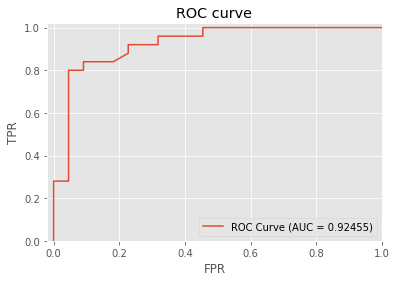

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.style.use('ggplot')
plt.plot(results['roc_curve']['fpr'],
         results['roc_curve']['tpr'],
         label='ROC Curve (AUC = %0.5f)' %results['auc'])

plt.xlim([-0.02, 1.0])
plt.ylim([0., 1.02])
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC curve')
plt.legend()
plt.show()

In [ ]:
cls.classify(test)

class,probability
1,0.9223255515098572
1,0.91600102186203
1,0.8556426763534546
1,0.9269140958786011
1,0.7282095551490784
1,0.9451742768287659
0,0.8006619364023209
0,0.8901260048151016
1,0.9561795592308044
1,0.6049807071685791


**Question 2:** Use three different centrality algorithms to identify managers at Enron.
    Evaluate the precision@10 of the algorithms, i.e. how many managers attained the top-10 highest ranks (30pt). Draw
    the network and visualize one of the centrality measures (10pt)
    

In [ ]:
!mkdir ./datasets/enron
!wget -O ./datasets/enron/enron_mail_20150507.tar.gz https://www.cs.cmu.edu/~./enron/enron_mail_20150507.tar.gz
!tar -zxvf ./datasets/enron/enron_mail_20150507.tar.gz -C ./datasets/enron/
!ls ./datasets/enron

Streaming output truncated to the last 5000 lines.
maildir/campbell-l/all_documents/1572.
maildir/campbell-l/all_documents/759.
maildir/campbell-l/all_documents/538.
maildir/campbell-l/all_documents/876.
maildir/campbell-l/all_documents/321.
maildir/campbell-l/all_documents/990.
maildir/campbell-l/all_documents/1842.
maildir/campbell-l/all_documents/1460.
maildir/campbell-l/all_documents/1840.
maildir/campbell-l/all_documents/274.
maildir/campbell-l/all_documents/448.
maildir/campbell-l/all_documents/1692.
maildir/campbell-l/all_documents/400.
maildir/campbell-l/all_documents/224.
maildir/campbell-l/all_documents/188.
maildir/campbell-l/all_documents/1670.
maildir/campbell-l/all_documents/1678.
maildir/campbell-l/all_documents/706.
maildir/campbell-l/all_documents/254.
maildir/campbell-l/all_documents/1429.
maildir/campbell-l/all_documents/1704.
maildir/campbell-l/all_documents/529.
maildir/campbell-l/all_documents/1039.
maildir/campbell-l/all_documents/1694.
maildir/campbell-l/all_doc

In [ ]:
# Note this is a simple example of parsing the Enron dataset. The code may miss some of the links
import os, re
from glob import glob
import networkx as nx
from tqdm import tqdm_notebook as tqdm

enron_data_set_path = "./datasets/enron/maildir"

def get_links_from_email(path):
    email_re = re.compile(r"([a-zA-Z0-9_.+-]+@[a-zA-Z0-9-]+\.[a-zA-Z0-9-.]+)")
    to_list = []
    from_list = []
    for line in open(path, "r", encoding='utf8', errors='ignore').readlines():
        line = line.strip().lower()
        if line.startswith("to:"):
            to_list = email_re.findall(line)
        if line.startswith("from:"):
            from_list = email_re.findall(line)
    links = set()
    if len(from_list) > 0 and len(to_list) >0:
        for e1 in from_list:
            for e2 in to_list:
                links.add((e1,e2))
    return links

links = set()
files_list = [p for p in glob(f"{enron_data_set_path}/*/*/*") if "/inbox/" in p or "/sent/" in p]
print("Found %s files" % len(files_list))
for i in tqdm(range(len(files_list))):
    p = files_list[i]
    if os.path.isfile(p):
        try:
            links |= get_links_from_email(p)
        except:
            continue

g = nx.DiGraph()

Found 99279 files


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/99279 [00:00<?, ?it/s]

In [ ]:
g = nx.DiGraph()
g.add_edges_from(links)
print(nx.info(g))

DiGraph with 18590 nodes and 32392 edges


In [ ]:
degree_centrality = nx.degree_centrality(g)
closeness_centrality = nx.closeness_centrality(g)
betweeness_centrality = nx.betweenness_centrality(g)

In [ ]:
import pandas as pd

degree_centrality_df = pd.DataFrame(data = {'Email': degree_centrality.keys(), 'Centrality': degree_centrality.values()})
closeness_centrality_df = pd.DataFrame(data = {'Email': closeness_centrality.keys(), 'Centrality': closeness_centrality.values()})
betweeness_centrality_df = pd.DataFrame(data = {'Email': betweeness_centrality.keys(), 'Centrality': betweeness_centrality.values()})


In [ ]:
top_ten_degree = degree_centrality_df.sort_values(by='Centrality', ascending=False).head(10)
top_ten_degree

,Email,Centrality
28,jeff.dasovich@enron.com,0.036742
49,sara.shackleton@enron.com,0.034483
222,tana.jones@enron.com,0.031416
14,gerald.nemec@enron.com,0.028727
167,kay.mann@enron.com,0.025338
151,kenneth.lay@enron.com,0.025069
47,vince.kaminski@enron.com,0.023347
175,debra.perlingiere@enron.com,0.022594
24,sally.beck@enron.com,0.019850
17,jeff.skilling@enron.com,0.019528


In [ ]:
topo_ten_closeness = closeness_centrality_df.sort_values(by='Centrality', ascending=False).head(10)
topo_ten_closeness

,Email,Centrality
682,john.lavorato@enron.com,0.079416
294,tim.belden@enron.com,0.079404
151,kenneth.lay@enron.com,0.079388
70,greg.whalley@enron.com,0.078275
24,sally.beck@enron.com,0.076271
120,louise.kitchen@enron.com,0.076049
940,k..allen@enron.com,0.074550
56,rick.buy@enron.com,0.073342
246,scott.neal@enron.com,0.073290
263,john.arnold@enron.com,0.071933


In [ ]:
to_ten_betweeness = betweeness_centrality_df.sort_values(by='Centrality', ascending=False).head(10)
to_ten_betweeness

,Email,Centrality
28,jeff.dasovich@enron.com,0.014953
24,sally.beck@enron.com,0.014901
682,john.lavorato@enron.com,0.013796
14,gerald.nemec@enron.com,0.012748
151,kenneth.lay@enron.com,0.010481
49,sara.shackleton@enron.com,0.009810
222,tana.jones@enron.com,0.007708
17,jeff.skilling@enron.com,0.007462
167,kay.mann@enron.com,0.007235
187,elizabeth.sager@enron.com,0.007169


In [ ]:
df_concat = pd.concat([top_ten_degree, topo_ten_closeness, to_ten_betweeness], ignore_index=True)
df_concat

,Email,Centrality
0,jeff.dasovich@enron.com,0.036742
1,sara.shackleton@enron.com,0.034483
2,tana.jones@enron.com,0.031416
3,gerald.nemec@enron.com,0.028727
4,kay.mann@enron.com,0.025338
5,kenneth.lay@enron.com,0.025069
6,vince.kaminski@enron.com,0.023347
7,debra.perlingiere@enron.com,0.022594
8,sally.beck@enron.com,0.019850
9,jeff.skilling@enron.com,0.019528


In [ ]:
df_group = df_concat.groupby(['Email']).mean()
df_group

,Centrality
Email,
debra.perlingiere@enron.com,0.022594
elizabeth.sager@enron.com,0.007169
gerald.nemec@enron.com,0.020738
greg.whalley@enron.com,0.078275
jeff.dasovich@enron.com,0.025848
jeff.skilling@enron.com,0.013495
john.arnold@enron.com,0.071933
john.lavorato@enron.com,0.046606
k..allen@enron.com,0.074550


In [ ]:
top_ten_centrality = df_group.sort_values(by='Centrality', ascending=False).head(10)
top_ten_centrality

,Centrality
Email,
tim.belden@enron.com,0.079404
greg.whalley@enron.com,0.078275
louise.kitchen@enron.com,0.076049
k..allen@enron.com,0.074550
rick.buy@enron.com,0.073342
scott.neal@enron.com,0.073290
john.arnold@enron.com,0.071933
john.lavorato@enron.com,0.046606
kenneth.lay@enron.com,0.038312


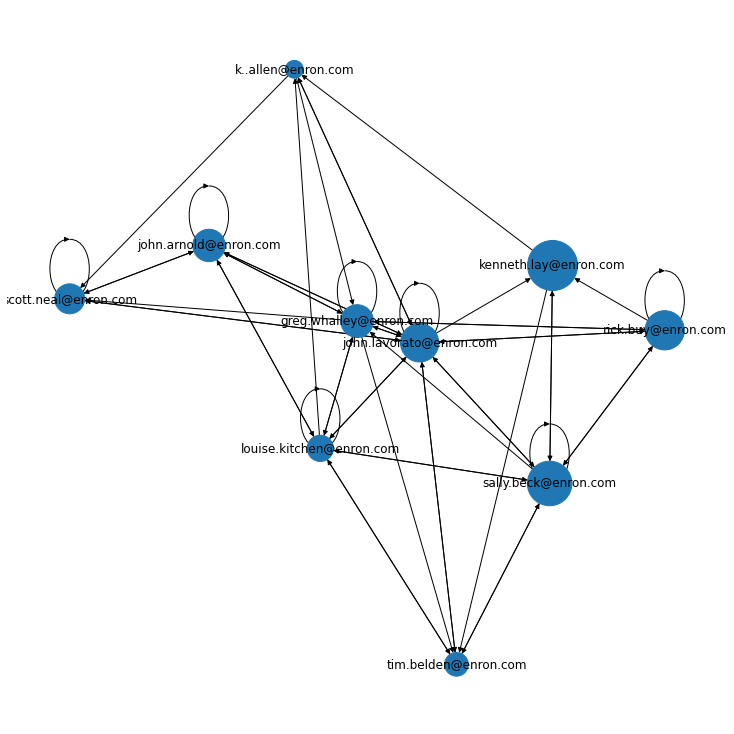

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

h = g.subgraph(top_ten_centrality.index)
plt.figure(figsize=(10,10))
nx.draw_spring(h, with_labels=True , node_size = [float(degree_centrality_df.loc[degree_centrality_df['Email'] == node]['Centrality'])*100000 for node in list(h.nodes())])